# Environment

Install the libraries listed below before running the rest of this notebook.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Note:** stick with Python 3.11 or earlier; some of the dependencies used here are not ready for 3.12 yet.

In [2]:
!python --version

Python 3.11.13


In [3]:
!pip install transformers==4.31.0 peft==0.4.0 accelerate==0.20.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/116.9 kB ? eta -:--:--
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.9/116.9 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 101.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.9/72.9 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.6/227.6 kB 31.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 119.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 114.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/

In [4]:
!pip install deepspeed
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/1.6 MB ? eta -:--:--
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 80.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 26.0 MB/s eta 0:00:00
  Created wheel for deepspeed: filename=deepspeed-0.18.2-py3-none-any.whl size=1763311 sha256=db6b4243c0415820c95915c0c493afca246e4b161ed4b85bfc10a6c7d4f3a2f6
  Stored in directory: /root/.cache/pip/wheels/80/2b/fe/f2625302f25976b9828a27d3d2567bdc1d587a1ff0ab42c8a9
Successfully built deepspeed


In [5]:
# !wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: anningl (anningl-carnegie-mellon-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


# Imports and basic checks

Load the core libraries and confirm CUDA is visible before doing anything heavy.

In [5]:
%cd drive/MyDrive/GenAI\ Project/VisCoT

/content/drive/MyDrive/GenAI Project/VisCoT


In [6]:
import os
import sys
import json
import torch
import transformers
from PIL import Image

from llava.train.train import train

print(f"PyTorch: {torch.__version__}")
print(f"CUDA Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

PyTorch: 2.6.0+cu124
CUDA Available: True
GPU: NVIDIA A100-SXM4-40GB


# Download the base checkpoints

Grab the released LLaVA weights and their CLIP vision tower so the rest of the notebook can refer to local copies.

In [ ]:
from huggingface_hub import snapshot_download
LLAVA_MODEL = "liuhaotian/llava-v1.5-7b"
VISION_TOWER = "openai/clip-vit-large-patch14-336"
print("Downloading models...\n")
print(f"1. {LLAVA_MODEL}")
llava_path = snapshot_download(repo_id=LLAVA_MODEL)
print(f"   Downloaded to: {llava_path}\n")
print(f"2. {VISION_TOWER}")
clip_path = snapshot_download(repo_id=VISION_TOWER)
print(f"   Downloaded to: {clip_path}\n")
print("Done!")


1. liuhaotian/llava-v1.5-7b


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin.index.json: 0.00B [00:00, ?B/s]

.gitattributes: 0.00B [00:00, ?B/s]

pytorch_model-00001-of-00002.bin:   0%|          | 0.00/9.98G [00:00<?, ?B/s]

pytorch_model-00002-of-00002.bin:   0%|          | 0.00/3.54G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/749 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/438 [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

mm_projector.bin:   0%|          | 0.00/42.0M [00:00<?, ?B/s]

   Downloaded to: /root/.cache/huggingface/hub/models--liuhaotian--llava-v1.5-7b/snapshots/4481d270cc22fd5c4d1bb5df129622006ccd9234

2. openai/clip-vit-large-patch14-336


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

.gitattributes: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/844 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

tf_model.h5:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

   Downloaded to: /root/.cache/huggingface/hub/models--openai--clip-vit-large-patch14-336/snapshots/ce19dc912ca5cd21c8a653c79e251e808ccabcd1

Done!


# Dataset sanity checks

Point to the normalized temporal splits and spot-check that the JSON and image folders look right.

In [ ]:
TEMPORAL_DIR = "../temporal"
TRAIN_JSON = os.path.join(TEMPORAL_DIR, "temporal_train.json")
VAL_JSON = os.path.join(TEMPORAL_DIR, "temporal_val.json")
TEST_JSON = os.path.join(TEMPORAL_DIR, "temporal_test.json")
IMAGE_FOLDER = os.path.join(TEMPORAL_DIR, "workspace/data")
# Check files
for name, path in [("Train", TRAIN_JSON), ("Val", VAL_JSON), ("Test", TEST_JSON)]:
    with open(path) as f:
        data = json.load(f)
    print(f"{name}: {len(data)} samples")
num_images = len([f for f in os.listdir(IMAGE_FOLDER) if f.endswith('.jpg')])
print(f"Images: {num_images}")
# Show sample
with open(TRAIN_JSON) as f:
    print("\nSample:")
    print(json.dumps(json.load(f)[0], indent=2))

Train: 576 samples
Val: 72 samples
Test: 72 samples
Images: 720

Sample:
{
  "id": "temporal_0211",
  "image": "211.jpg",
  "conversations": [
    {
      "from": "human",
      "value": "<image>\nTASK: Determine temporal order of LEFT and RIGHT images. \n    STEP 1: Describe key differences between the images (look for: burnt/cut objects, people positions, sun/shadow positions, object states, etc.)\n    STEP 2: Analyze which state came first chronologically.\n    STEP 3: State your final answer. FORMAT: Write \"ANSWER: first\" if LEFT happened earlier, or \"ANSWER: second\" if RIGHT happened earlier. Then explain your reasoning in 1-2 sentences."
    },
    {
      "from": "gpt",
      "value": "first"
    }
  ]
}


In [ ]:
# Ensure each human prompt explicitly includes an <image> token for multimodal training
import json, os
from llava.constants import DEFAULT_IMAGE_TOKEN

def add_image_token(path):
    with open(path) as f:
        data = json.load(f)
    updated = 0
    for sample in data:
        conv = sample.get("conversations", [])
        if conv and conv[0].get("from") == "human":
            text = conv[0].get("value", "")
            if DEFAULT_IMAGE_TOKEN not in text:
                conv[0]["value"] = f"{DEFAULT_IMAGE_TOKEN}\n{text}"
                updated += 1
    with open(path, 'w') as f:
        json.dump(data, f, indent=2)
    print(f"{os.path.basename(path)}: added <image> to {updated} samples")
for path in [TRAIN_JSON, VAL_JSON, TEST_JSON]:
    add_image_token(path)

temporal_train.json: added <image> to 0 samples
temporal_val.json: added <image> to 0 samples
temporal_test.json: added <image> to 0 samples


# Training knobs

Keep the hyper-parameters in one place so it is obvious which experiment is running.

In [ ]:
OUTPUT_DIR = "./checkpoints/viscot_temporal_prefix"

### experiment 1
# NUM_EPOCHS = 2
BATCH_SIZE = 2
GRAD_ACCUM = 8
# LR = 1e-3

### experiment 2
NUM_EPOCHS = 4
LR = 2e-4
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Output: {OUTPUT_DIR}")
print(f"Epochs: {NUM_EPOCHS}")
print(f"Batch Size: {BATCH_SIZE} x {GRAD_ACCUM} = {BATCH_SIZE*GRAD_ACCUM}")
print(f"Learning Rate: {LR}")

Output: ./checkpoints/viscot_temporal_prefix
Epochs: 4
Batch Size: 2 x 8 = 16
Learning Rate: 0.0002


In [11]:
import warnings
warnings.filterwarnings('ignore')

# Set arguments
sys.argv = [
    'train',
    '--model_name_or_path', LLAVA_MODEL,
    '--version', 'v1',
    '--vision_tower', VISION_TOWER,
    '--mm_projector_type', 'mlp2x_gelu',
    '--mm_vision_select_layer', '-2',
    '--mm_use_im_start_end', 'False',
    '--mm_use_im_patch_token', 'False',

    # Prefix tuning: freeze backbone, train projector only
    '--freeze_backbone', 'True',
    '--tune_mm_mlp_adapter', 'True',
    '--freeze_mm_mlp_adapter', 'False',

    # Data
    '--data_path', TRAIN_JSON,
    '--is_multimodal', 'True',
    '--image_folder', IMAGE_FOLDER,
    '--image_aspect_ratio', 'pad',
    '--group_by_modality_length', 'False',
    '--lazy_preprocess', 'True',

    # Training parameters (use variables from cell-15)
    '--bf16', 'False',
    '--fp16', 'True',
    '--output_dir', OUTPUT_DIR,
    '--num_train_epochs', str(NUM_EPOCHS),
    '--per_device_train_batch_size', str(BATCH_SIZE),
    '--gradient_accumulation_steps', str(GRAD_ACCUM),
    '--evaluation_strategy', 'no',
    '--save_strategy', 'epoch',
    '--save_total_limit', '3',
    '--learning_rate', str(LR),
    '--weight_decay', '0.0',
    '--warmup_ratio', '0.03',
    '--lr_scheduler_type', 'cosine',
    '--logging_steps', '10',
    '--tf32', 'False',
    '--model_max_length', '2048',
    '--gradient_checkpointing', 'True',
    '--dataloader_num_workers', '4',
    # '--report_to', 'wandb',
    '--report_to', 'tensorboard',
]

print("Starting training...")
print("Method: Prefix tuning (train projector only, freeze backbone)\n")
print(f"Effective batch size: {BATCH_SIZE} x {GRAD_ACCUM} = {BATCH_SIZE*GRAD_ACCUM}")
print(f"Total epochs: {NUM_EPOCHS}")
print(f"Learning rate: {LR}\n")

try:
    train()
    print("\nTraining completed!")
except Exception as e:
    print(f"\nError: {e}")
    import traceback
    traceback.print_exc()

Starting training...
Method: Prefix tuning (train projector only, freeze backbone)

Effective batch size: 2 x 8 = 16
Total epochs: 4
Learning rate: 0.0002



You are using a model of type llava to instantiate a model of type viscot_llava. This is not supported for all configurations of models and can yield errors.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of LlavaLlamaForCausalLM were not initialized from the model checkpoint at liuhaotian/llava-v1.5-7b and are newly initialized: ['model.vision_tower.vision_tower.vision_model.encoder.layers.20.self_attn.out_proj.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.11.layer_norm2.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.9.self_attn.k_proj.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.23.mlp.fc2.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.11.self_attn.v_proj.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.19.layer_norm1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.5.mlp.fc1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.16.layer_norm2.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.17.self_attn.q_proj.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.self_attn.k_proj.weight', '

Formatting inputs...Skip in lazy mode


Step,Training Loss
10,2.273000
20,1.330000
30,0.395300
40,0.356000
50,0.355700
60,0.363900
70,0.352900
80,0.355500
90,0.354500
100,0.356500



Training completed!


# Loading the trained projector

Bring the latest checkpoint back into memory and make sure the projector weights landed on the GPU without NaNs.

In [ ]:
# from llava.model.builder import load_pretrained_model
# from llava.mm_utils import get_model_name_from_path
# import torch

# # Find latest checkpoint
# checkpoints = sorted([d for d in os.listdir(OUTPUT_DIR) if d.startswith('checkpoint-')])

# if checkpoints:
#     checkpoint_path = os.path.join(OUTPUT_DIR, checkpoints[-1])
#     print(f"Loading checkpoint: {checkpoint_path}")

#     # Load base model first
#     print("Loading base LLaVA model...")
#     tokenizer, model, image_processor, context_len = load_pretrained_model(
#         model_path=LLAVA_MODEL,
#         model_base=None,
#         model_name=get_model_name_from_path(LLAVA_MODEL)
#     )

#     # Move model to GPU and convert to fp16 BEFORE loading fine-tuned weights
#     if torch.cuda.is_available():
#         model = model.cuda()
#         model = model.half()
#         print(f"\nConverted model to FP16")
#         print(f"Model dtype: {next(model.parameters()).dtype}")

#     # Load the fine-tuned projector weights
#     mm_projector_path = os.path.join(checkpoint_path, 'mm_projector.bin')
#     print(f"\nLoading fine-tuned projector from: {mm_projector_path}")
#     projector_weights = torch.load(mm_projector_path, map_location='cpu')

#     print(f"Checkpoint contains {len(projector_weights)} keys:")
#     for key in projector_weights.keys():
#         print(f"  - {key}: {projector_weights[key].shape}")

#     # Convert checkpoint weights to match model dtype and device
#     for key in projector_weights.keys():
#         projector_weights[key] = projector_weights[key].half().cuda()

#     # Load weights (strict=False because we're only loading projector)
#     msg = model.load_state_dict(projector_weights, strict=False)
#     print(f"\nLoad result:")
#     print(f"  Missing keys: {len(msg.missing_keys)} (expected - these are frozen backbone weights)")
#     print(f"  Unexpected keys: {len(msg.unexpected_keys)}")

#     # Verify the projector weights were actually loaded
#     print(f"\nVerifying projector was loaded:")
#     for key in projector_weights.keys():
#         model_param = model.state_dict()[key]
#         checkpoint_param = projector_weights[key]
#         if torch.allclose(model_param, checkpoint_param, rtol=1e-3):
#             print(f"    {key} loaded correctly")
#         else:
#             print(f"  ✗ {key} NOT loaded correctly!")
#             print(f"    Model param dtype: {model_param.dtype}, Checkpoint dtype: {checkpoint_param.dtype}")

# else:
#     print("No checkpoint found, loading base model...")
#     tokenizer, model, image_processor, context_len = load_pretrained_model(
#         model_path=LLAVA_MODEL,
#         model_base=None,
#         model_name=get_model_name_from_path(LLAVA_MODEL)
#     )

#     # Move to GPU and convert to fp16
#     if torch.cuda.is_available():
#         model = model.cuda()
#         model = model.half()

# print(f"\nFinal model state:")
# print(f"  Device: {next(model.parameters()).device}")
# print(f"  Dtype: {next(model.parameters()).dtype}")
# print(f"  Projector dtype: {model.model.mm_projector[0].weight.dtype}")
# print("\nModel loaded successfully!")

# Temporal evaluation

Run the helper to score the binary temporal ordering task and print the per-class precision/recall numbers.

In [ ]:
from llava.model.builder import load_pretrained_model
from llava.mm_utils import get_model_name_from_path
import torch

checkpoints = sorted([d for d in os.listdir(OUTPUT_DIR) if d.startswith('checkpoint-')])

if checkpoints:
    checkpoint_path = os.path.join(OUTPUT_DIR, checkpoints[-1])
    print(f"Loading checkpoint: {checkpoint_path}")
    print("Loading base LLaVA model...")
    print(f"Model path: {LLAVA_MODEL}")
    print(f"Vision tower: {VISION_TOWER}")
    # Load base model
    tokenizer, model, image_processor, context_len = load_pretrained_model(
        model_path=LLAVA_MODEL,
        model_base=None,
        model_name=get_model_name_from_path(LLAVA_MODEL),
        load_8bit=False,
        load_4bit=False,
        # torch_dtype=torch.float16,
        # low_cpu_mem_usage=False,
        device_map={"": "cuda:0"},    # 或直接 None 后手动 .cuda()
    )
    model = model.cuda().half()


    print("\nInitializing vision tower...")
    vision_tower = model.get_vision_tower()
    if not vision_tower.is_loaded:
        vision_tower.load_model()

    print("Moving model to GPU and converting to FP16...")
    model = model.cuda()

    # Convert ALL components to FP16
    model = model.half()  # Convert entire model to FP16

    print("  Converted to FP16 successfully")

    # Test vision tower
    print("\nTesting vision tower...")
    dummy_img = torch.randn(1, 3, 336, 336).half().cuda()
    with torch.no_grad():
        test_features = vision_tower(dummy_img)

    print(f"Vision output shape: {test_features.shape}")
    print(f"Has NaN: {torch.isnan(test_features).any().item()}")
    print(f"Has Inf: {torch.isinf(test_features).any().item()}")

    if torch.isnan(test_features).any():
        print("\n ERROR: Vision tower still produces NaN!")
        print("Trying to reload vision tower from scratch...")
        from transformers import CLIPVisionModel
        vision_model = CLIPVisionModel.from_pretrained(VISION_TOWER).cuda().half()
        model.get_vision_tower().vision_tower = vision_model

        # Test again
        with torch.no_grad():
            test_features = vision_tower(dummy_img)
        print(f"After reload - Has NaN: {torch.isnan(test_features).any().item()}")

    # Load fine-tuned projector weights
    mm_projector_path = os.path.join(checkpoint_path, 'mm_projector.bin')
    print(f"\nLoading fine-tuned projector from: {mm_projector_path}")

    projector_weights = torch.load(mm_projector_path, map_location='cpu')

    # Convert projector weights to FP16 and move to GPU
    for key in projector_weights.keys():
        projector_weights[key] = projector_weights[key].half().cuda()

    # Load the weights
    msg = model.load_state_dict(projector_weights, strict=False)
    print(f"Loaded projector - Missing: {len(msg.missing_keys)}, Unexpected: {len(msg.unexpected_keys)}")

    # Final sanity check
    print("\n" + "="*60)
    print("Final model state:")
    print(f"  Device: {next(model.parameters()).device}")
    print(f"  Dtype: {next(model.parameters()).dtype}")

    # Test full pipeline
    print("\nFinal vision tower test:")
    with torch.no_grad():
        vision_out = vision_tower(dummy_img)
        projector_out = model.get_model().mm_projector(vision_out)

    print(f"  Vision output has NaN: {torch.isnan(vision_out).any().item()}")
    print(f"  Projector output has NaN: {torch.isnan(projector_out).any().item()}")
    print(f"  Vision output mean: {vision_out.mean().item()}")

    if not torch.isnan(projector_out).any():
        print("\n  Model loaded successfully without NaN!")
    else:
        print("\n❌ WARNING: Still have NaN in the pipeline!")
    print("="*60)

else:
    print("No checkpoints found!")

Loading checkpoint: ./checkpoints/viscot_temporal_prefix/checkpoint-72
Loading base LLaVA model...
Model path: liuhaotian/llava-v1.5-7b
Vision tower: openai/clip-vit-large-patch14-336


You are using a model of type llava to instantiate a model of type viscot_llava. This is not supported for all configurations of models and can yield errors.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of LlavaLlamaForCausalLM were not initialized from the model checkpoint at liuhaotian/llava-v1.5-7b and are newly initialized: ['model.vision_tower.vision_tower.vision_model.encoder.layers.20.self_attn.out_proj.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.11.layer_norm2.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.9.self_attn.k_proj.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.23.mlp.fc2.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.11.self_attn.v_proj.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.19.layer_norm1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.5.mlp.fc1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.16.layer_norm2.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.17.self_attn.q_proj.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.self_attn.k_proj.weight', '


Initializing vision tower...
Moving model to GPU and converting to FP16...
✓ Converted to FP16 successfully

Testing vision tower...
Vision output shape: torch.Size([1, 576, 1024])
Has NaN: True
Has Inf: False

 ERROR: Vision tower still produces NaN!
Trying to reload vision tower from scratch...
After reload - Has NaN: False

Loading fine-tuned projector from: ./checkpoints/viscot_temporal_prefix/checkpoint-72/mm_projector.bin
Loaded projector - Missing: 714, Unexpected: 0

Final model state:
  Device: cuda:0
  Dtype: torch.float16

Final vision tower test:
  Vision output has NaN: False
  Projector output has NaN: False
  Vision output mean: 0.052154541015625

✓ Model loaded successfully without NaN!


### accuracy / precision / recall / F1

In [ ]:
import os
import json
from PIL import Image
import torch
from llava.mm_utils import tokenizer_image_token
from llava.constants import IMAGE_TOKEN_INDEX, DEFAULT_IMAGE_TOKEN


def _safe_div(num: float, den: float) -> float:
    return num / den if den else 0.0


def evaluate(model, tokenizer, image_processor, test_json, image_folder):
    """Evaluate model on test set (binary first/second) with weighted precision/recall/F1."""
    with open(test_json, 'r') as f:
        data = json.load(f)

    vocab_size = len(tokenizer)

    results = []
    unknown = 0
    model.eval()

    for i, sample in enumerate(data):
        img_path = os.path.join(image_folder, sample['image'])
        image = Image.open(img_path).convert('RGB')

        # Ensure prompt has an image token
        prompt = sample['conversations'][0]['value']
        if DEFAULT_IMAGE_TOKEN not in prompt:
            prompt = f"{DEFAULT_IMAGE_TOKEN}{prompt}"

        ground_truth = sample['conversations'][1]['value'].strip().lower()

        # Process image
        img_tensor = image_processor.preprocess(image, return_tensors='pt')['pixel_values'].half().cuda()

        # Tokenize prompt with IMAGE_TOKEN_INDEX
        input_ids = tokenizer_image_token(
            prompt,
            tokenizer,
            IMAGE_TOKEN_INDEX,
            return_tensors='pt'
        ).unsqueeze(0).cuda()

        # Generate output
        with torch.no_grad():
            out = model.generate(
                input_ids,
                images=img_tensor,
                do_sample=False,
                max_new_tokens=128,
                use_cache=True,
                eos_token_id=tokenizer.eos_token_id,
                pad_token_id=tokenizer.pad_token_id if tokenizer.pad_token_id is not None else tokenizer.eos_token_id
            )

        generated_ids = out[0, input_ids.shape[1]:].tolist()

        valid_ids = []
        for token_id in generated_ids:
            if token_id == IMAGE_TOKEN_INDEX or token_id < 0 or token_id >= vocab_size:
                continue
            if token_id == tokenizer.eos_token_id:
                break
            valid_ids.append(token_id)

        output = tokenizer.decode(valid_ids, skip_special_tokens=True).strip()

        # Determine predicted class
        output_lower = output.lower()
        if 'first' in output_lower:
            predicted = 'first'
        elif 'second' in output_lower:
            predicted = 'second'
        else:
            predicted = 'unknown'

        is_correct = predicted == ground_truth
        results.append({
            'id': sample['id'],
            'image': sample['image'],
            'ground_truth': ground_truth,
            'predicted': predicted,
            'full_output': output,
            'correct': is_correct
        })

        if predicted == 'unknown':
            unknown += 1

        print(f"[{i+1}/{len(data)}] {sample['id']}")
        print(f"  GT: {ground_truth}")
        print(f"  Pred: {predicted}")
        print(f"  Full output: {output[:200]}")
        print("    Correct" if is_correct else "  ✗ Wrong")
    # Compute metrics
    labels = ['first', 'second']
    conf = {c: {'tp': 0, 'fp': 0, 'fn': 0, 'count': 0} for c in labels}

    for r in results:
        gt = r['ground_truth']
        pred = r['predicted']

        if gt in labels:
            conf[gt]['count'] += 1

        if pred not in labels:
            if gt in labels:
                conf[gt]['fn'] += 1
            continue

        for c in labels:
            if pred == c and gt == c:
                conf[c]['tp'] += 1
            elif pred == c and gt != c:
                conf[c]['fp'] += 1
            elif gt == c and pred != c:
                conf[c]['fn'] += 1

    # Per-class metrics
    metrics = {}
    for c in labels:
        tp, fp, fn = conf[c]['tp'], conf[c]['fp'], conf[c]['fn']
        prec = _safe_div(tp, tp + fp)
        rec = _safe_div(tp, tp + fn)
        f1 = _safe_div(2 * prec * rec, prec + rec) if (prec + rec) else 0.0

        metrics[f"{c}_precision"] = prec
        metrics[f"{c}_recall"] = rec
        metrics[f"{c}_f1"] = f1

    # Macro averages
    metrics["macro_precision"] = sum(metrics[f"{c}_precision"] for c in labels) / 2
    metrics["macro_recall"] = sum(metrics[f"{c}_recall"] for c in labels) / 2
    metrics["macro_f1"] = sum(metrics[f"{c}_f1"] for c in labels) / 2

    # Weighted averages
    total = sum(conf[c]["count"] for c in labels)

    metrics["weighted_precision"] = (
        sum(conf[c]["count"] * metrics[f"{c}_precision"] for c in labels) / total
        if total else 0.0
    )
    metrics["weighted_recall"] = (
        sum(conf[c]["count"] * metrics[f"{c}_recall"] for c in labels) / total
        if total else 0.0
    )
    metrics["weighted_f1"] = (
        sum(conf[c]["count"] * metrics[f"{c}_f1"] for c in labels) / total
        if total else 0.0
    )

    # Accuracy & unknown
    metrics["accuracy"] = (
        sum(1 for r in results if r["correct"]) / len(results) if results else 0.0
    )
    metrics["unknown_frac"] = _safe_div(unknown, len(results))
    # Print Summary
    print("\n" + "="*60)
    print(
        f"Accuracy: {metrics['accuracy']:.4f} | "
        f"Weighted P/R/F1: {metrics['weighted_precision']:.4f} / "
        f"{metrics['weighted_recall']:.4f} / {metrics['weighted_f1']:.4f} | "
        f"Unknown: {metrics['unknown_frac']:.4f}"
    )

    for c in labels:
        print(
            f"{c.capitalize():>6} - "
            f"P: {metrics[f'{c}_precision']:.4f} "
            f"R: {metrics[f'{c}_recall']:.4f} "
            f"F1: {metrics[f'{c}_f1']:.4f} "
            f"(count={conf[c]['count']})"
        )
    print("="*60)

    return results, metrics


In [23]:

# Run evaluation
results, metrics = evaluate(model, tokenizer, image_processor, TEST_JSON, IMAGE_FOLDER)


[1/72] temporal_0521
  GT: second
  Pred: second
  Full output: second
  ✓ Correct
[2/72] temporal_0546
  GT: first
  Pred: second
  Full output: second
  ✗ Wrong
[3/72] temporal_0553
  GT: second
  Pred: first
  Full output: first
  ✗ Wrong
[4/72] temporal_0000
  GT: second
  Pred: second
  Full output: second
  ✓ Correct
[5/72] temporal_0248
  GT: second
  Pred: first
  Full output: first
  ✗ Wrong
[6/72] temporal_0200
  GT: second
  Pred: first
  Full output: first
  ✗ Wrong
[7/72] temporal_0088
  GT: second
  Pred: first
  Full output: first
  ✗ Wrong
[8/72] temporal_0369
  GT: first
  Pred: second
  Full output: second
  ✗ Wrong
[9/72] temporal_0085
  GT: first
  Pred: second
  Full output: second
  ✗ Wrong
[10/72] temporal_0490
  GT: second
  Pred: first
  Full output: first
  ✗ Wrong
[11/72] temporal_0707
  GT: first
  Pred: first
  Full output: first
  ✓ Correct
[12/72] temporal_0312
  GT: first
  Pred: first
  Full output: first
  ✓ Correct
[13/72] temporal_0168
  GT: first
  

# Optional: save the merged weights

Uncomment if you want to write the checkpoint somewhere outside the deepspeed folder.

In [ ]:
# # save model
# final_path = os.path.join(OUTPUT_DIR, "final_model")
# os.makedirs(final_path, exist_ok=True)

# model.save_pretrained(final_path)
# tokenizer.save_pretrained(final_path)

# print(f"Model saved to: {final_path}")

# RecipeQA evaluation

Reuse the already loaded Visual-CoT model to see how well the temporal adapter transfers to RecipeQA.

In [ ]:
"""
Add this cell to the end of your viscot.ipynb.
Used to evaluate the RecipeQA dataset.

Prerequisite:
The temporal model must already be loaded in previous cells
(tokenizer, model, image_processor must exist).
"""
# RecipeQA Evaluation

from llava.mm_utils import tokenizer_image_token
from llava.constants import IMAGE_TOKEN_INDEX
import json
import torch
from PIL import Image
import os

print("=" * 60)
print("RecipeQA Evaluation (using the currently loaded model)")
print("=" * 60)

# RecipeQA paths
TEST_JSON = "../recipeqa/recipeqa_test.json"
TEST_IMAGE_FOLDER = "../recipeqa/test"

# Load dataset
with open(TEST_JSON, 'r') as f:
    data = json.load(f)

print(f"\nNumber of test samples: {len(data)}")

vocab_size = len(tokenizer)

correct = 0
total = 0
results = []

# Evaluation loop
for i, sample in enumerate(data):
    img_path = os.path.join(TEST_IMAGE_FOLDER, sample['image'])
    image = Image.open(img_path).convert('RGB')

    prompt_text = sample['conversations'][0]['value']
    prompt = f"<image>\n{prompt_text}"   # manually add <image> token
    ground_truth = sample['conversations'][1]['value'].strip().lower()

    # Process image
    image_tensor = image_processor.preprocess(image, return_tensors='pt')['pixel_values']
    img_tensor = image_tensor.half().cuda()

    # Tokenize prompt
    input_ids = tokenizer_image_token(
        prompt,
        tokenizer,
        IMAGE_TOKEN_INDEX,
        return_tensors='pt'
    ).unsqueeze(0).cuda()

    # Generate model output
    with torch.no_grad():
        out = model.generate(
            input_ids,
            images=img_tensor,
            do_sample=False,
            max_new_tokens=128,
            use_cache=True,
            eos_token_id=tokenizer.eos_token_id,
            pad_token_id=tokenizer.pad_token_id if tokenizer.pad_token_id is not None else tokenizer.eos_token_id
        )

    # Decode output tokens
    generated_ids = out[0, input_ids.shape[1]:].tolist()

    valid_ids = []
    for token_id in generated_ids:
        if token_id == IMAGE_TOKEN_INDEX or token_id < 0 or token_id >= vocab_size:
            continue
        if token_id == tokenizer.eos_token_id:
            break
        valid_ids.append(token_id)

    output = tokenizer.decode(valid_ids, skip_special_tokens=True).strip()

    # Extract prediction (true/false)
    output_lower = output.lower()
    if 'true' in output_lower:
        predicted = 'true'
    elif 'false' in output_lower:
        predicted = 'false'
    else:
        predicted = 'unknown'

    is_correct = (predicted == ground_truth)
    if is_correct:
        correct += 1
    total += 1

    results.append({
        'id': sample['id'],
        'image': sample['image'],
        'ground_truth': ground_truth,
        'predicted': predicted,
        'full_output': output,
        'correct': is_correct
    })

    # Progress logging
    if i < 10 or (i + 1) % 20 == 0:
        print(f"\n[{i+1}/{len(data)}] {sample['id']}")
        print(f"  GT: {ground_truth} | Pred: {predicted} | {' ' if is_correct else '✗'}")
        if i < 5:
            print(f"  Output: '{output[:100]}'")

# Final results
accuracy = correct / total if total > 0 else 0

print("\n" + "=" * 60)
print("Final Results")
print("=" * 60)
print(f"Accuracy: {correct}/{total} = {accuracy:.2%}")
print("=" * 60)

# Show sample errors
print("\nExamples of Incorrect Predictions:")
wrong_samples = [r for r in results if not r['correct']][:5]
for r in wrong_samples:
    print(f"\n{r['id']}")
    print(f"  GT: {r['ground_truth']}, Pred: {r['predicted']}")
    print(f"  Output: {r['full_output'][:100]}")

# Save results
results_path = "./recipeqa_eval_results.json"
with open(results_path, 'w') as f:
    json.dump({
        'accuracy': accuracy,
        'correct': correct,
        'total': total,
        'results': results
    }, f, indent=2)

print(f"\n  Results saved to: {results_path}")

RecipeQA Evaluation (using the currently loaded model)

Number of test samples: 80

[1/80] recipeqa_50_0
  GT: true | Pred: unknown | ✗
  Output: 'first'

[2/80] recipeqa_50_1
  GT: false | Pred: unknown | ✗
  Output: 'first'

[3/80] recipeqa_50_2
  GT: false | Pred: unknown | ✗
  Output: 'first'

[4/80] recipeqa_50_3
  GT: false | Pred: unknown | ✗
  Output: 'first'

[5/80] recipeqa_51_0
  GT: false | Pred: unknown | ✗
  Output: 'first'

[6/80] recipeqa_51_1
  GT: false | Pred: unknown | ✗

[7/80] recipeqa_51_2
  GT: false | Pred: unknown | ✗

[8/80] recipeqa_51_3
  GT: true | Pred: unknown | ✗

[9/80] recipeqa_52_0
  GT: false | Pred: unknown | ✗

[10/80] recipeqa_52_1
  GT: false | Pred: unknown | ✗

[20/80] recipeqa_54_3
  GT: true | Pred: unknown | ✗

[40/80] recipeqa_59_3
  GT: true | Pred: unknown | ✗

[60/80] recipeqa_64_3
  GT: false | Pred: unknown | ✗

[80/80] recipeqa_69_3
  GT: false | Pred: unknown | ✗

Final Results
Accuracy: 0/80 = 0.00%

Examples of Incorrect Predictio

## Dataset visualization

In [ ]:
!pip install opencv-python matplotlib

In [ ]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2


class LLaVAGradCAM:
    """Grad-CAM specifically for LLaVA vision tower"""

    def __init__(self, model):
        """
        Args:
            model: LLaVA model
        """
        self.model = model
        self.vision_tower = model.get_vision_tower()

        # For CLIP ViT, we'll hook into the last layer
        try:
            self.target_layer = self.vision_tower.vision_tower.vision_model.encoder.layers[-1]
            print("  Successfully hooked into vision tower last layer")
        except Exception as e:
            print(f"Warning: Could not find standard layer structure: {e}")
            self.target_layer = None

        self.activations = None

        if self.target_layer:
            self.target_layer.register_forward_hook(self.save_activation)

    def save_activation(self, module, input, output):
        """Save activations from forward pass"""
        if isinstance(output, tuple):
            self.activations = output[0].detach()
        else:
            self.activations = output.detach()

    def generate_cam_for_image(self, image_tensor):
        """Generate attention map for input image"""
        with torch.no_grad():
            image_features = self.vision_tower(image_tensor)

        if self.activations is None:
            print("No activations captured!")
            return None

        activations = self.activations[0]  # [num_patches, hidden_dim]
        patch_importance = activations.mean(dim=-1)  # [num_patches]

        num_patches = patch_importance.shape[0]

        # Handle CLS token
        if num_patches == 577:  # 24*24 + 1 CLS token
            patch_importance = patch_importance[1:]
            grid_size = 24
        elif num_patches == 576:  # 24*24
            grid_size = 24
        else:
            grid_size = int(np.sqrt(num_patches - 1))
            patch_importance = patch_importance[1:]

        # Reshape to 2D grid
        attention_map = patch_importance.reshape(grid_size, grid_size).cpu().numpy()

        # Normalize to [0, 1]
        attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min() + 1e-8)

        return attention_map


def visualize_gradcam(original_image, cam, alpha=0.4):
    """Overlay Grad-CAM heatmap on original image"""
    if isinstance(original_image, Image.Image):
        original_image = np.array(original_image)

    # Ensure cam is valid 2D array
    if len(cam.shape) != 2:
        print(f"Error: CAM should be 2D, got shape {cam.shape}")
        return Image.fromarray(original_image)

    # Ensure cam is float64 for cv2.resize
    cam = cam.astype(np.float64)

    # Resize CAM to match image size (width, height)
    h, w = original_image.shape[:2]
    cam_resized = cv2.resize(cam, (w, h), interpolation=cv2.INTER_LINEAR)

    # Apply colormap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # Overlay
    overlayed = (1 - alpha) * original_image + alpha * heatmap
    overlayed = np.clip(overlayed, 0, 255).astype(np.uint8)

    return Image.fromarray(overlayed)

def plot_temporal_comparison(image_path, model, image_processor, save_path=None):
    """Visualize attention for temporal reasoning task"""
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    image_tensor = image_processor.preprocess(image, return_tensors='pt')['pixel_values'].half().cuda()

    # Generate attention map via GradCAM
    gradcam = LLaVAGradCAM(model)
    attention_map = gradcam.generate_cam_for_image(image_tensor)

    if attention_map is None:
        print("Failed to generate attention map")
        return None, (0, 0)

    # Resize overlay image
    overlay = visualize_gradcam(image, attention_map, alpha=0.5)

    # Visualization layout
    fig = plt.figure(figsize=(28, 10))

    # --- Original image ---
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.imshow(image)
    ax1.set_title("Original Image", fontsize=18)
    ax1.axis("off")

    # --- Enlarged Heatmap ---
    ax2 = fig.add_subplot(1, 6, 3)
    heatmap_large = cv2.resize(attention_map, (512, 512), interpolation=cv2.INTER_NEAREST)
    im = ax2.imshow(heatmap_large, cmap='jet')
    ax2.set_title("Attention Heatmap", fontsize=18)
    ax2.axis("off")
    plt.colorbar(im, ax=ax2, fraction=0.046)

    # --- Overlay ---
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.imshow(overlay)
    ax3.set_title("Overlay", fontsize=18)
    ax3.axis("off")

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')

    plt.show()

    # Left/Right attention analysis
    h, w = attention_map.shape
    left_attention = attention_map[:, :w//2].mean()
    right_attention = attention_map[:, w//2:].mean()

    print("\nAttention Analysis:")
    print(f"  Left:  {left_attention:.4f}")
    print(f"  Right: {right_attention:.4f}")
    print(f"  Ratio: {left_attention/right_attention:.4f}")

    if left_attention > right_attention:
        print("  → Model focuses on LEFT")
    else:
        print("  → Model focuses on RIGHT")

    return attention_map, (left_attention, right_attention)

def analyze_multiple_samples(model, image_processor, test_json, image_folder, num_samples=5):
    """Analyze attention patterns across multiple samples"""
    import json

    with open(test_json, 'r') as f:
        data = json.load(f)

    results = []

    for i, sample in enumerate(data[:num_samples]):
        print(f"\n{'='*60}")
        print(f"[{i+1}/{num_samples}] {sample['id']} | GT: {sample['conversations'][1]['value']}")

        img_path = os.path.join(image_folder, sample['image'])
        attention_map, (left_attn, right_attn) = plot_temporal_comparison(
            img_path, model, image_processor,
            save_path=f"gradcam_{i+1}.png"
        )

        if attention_map is not None:
            results.append({
                'id': sample['id'],
                'ground_truth': sample['conversations'][1]['value'],
                'left_attention': left_attn,
                'right_attention': right_attn,
                'ratio': left_attn / right_attn if right_attn > 0 else 0
            })

    # Summary
    if results:
        print(f"\n{'='*60}")
        print("SUMMARY")
        print(f"{'='*60}")

        left_avg = np.mean([r['left_attention'] for r in results])
        right_avg = np.mean([r['right_attention'] for r in results])

        print(f"Average Left:  {left_avg:.4f}")
        print(f"Average Right: {right_avg:.4f}")
        print(f"Overall Ratio: {left_avg/right_avg:.4f}")

        if left_avg/right_avg > 1.2:
            print("\n   Model shows LEFT bias!")
        elif left_avg/right_avg < 0.8:
            print("\n   Model shows RIGHT bias!")

    return results

print("  Grad-CAM loaded!")


def plot_recipeqa_gradcam(image_path, model, image_processor, save_path=None):
    """Grad-CAM visualization for a RecipeQA sample (4-step strip)."""
    image = Image.open(image_path).convert('RGB')
    image_tensor = image_processor.preprocess(image, return_tensors='pt')['pixel_values'].half().cuda()

    gradcam = LLaVAGradCAM(model)
    attention_map = gradcam.generate_cam_for_image(image_tensor)
    if attention_map is None:
        print("Failed to generate attention map")
        return None, []

    overlay = visualize_gradcam(image, attention_map, alpha=0.5)

    # Split heatmap into 4 vertical slices (one per step)
    h, w = attention_map.shape
    slice_w = w // 4
    step_attn = []
    for i in range(4):
        start = i * slice_w
        end = (i + 1) * slice_w if i < 3 else w
        step_attn.append(attention_map[:, start:end].mean())

    print("\nStep attention:")
    for i, val in enumerate(step_attn, 1):
        print(f"  Step {i}: {val:.4f}")

    fig = plt.figure(figsize=(28, 10))
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=18)
    ax1.axis('off')

    ax2 = fig.add_subplot(1, 6, 3)
    heatmap_large = cv2.resize(attention_map, (512, 512), interpolation=cv2.INTER_NEAREST)
    im = ax2.imshow(heatmap_large, cmap='jet')
    ax2.set_title('Attention Heatmap', fontsize=18)
    ax2.axis('off')
    plt.colorbar(im, ax=ax2, fraction=0.046)

    ax3 = fig.add_subplot(1, 3, 3)
    ax3.imshow(overlay)
    ax3.set_title('Overlay', fontsize=18)
    ax3.axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

    return attention_map, step_attn


def analyze_recipeqa_samples(model, image_processor, test_json, image_folder, num_samples=5):
    """Run Grad-CAM over RecipeQA samples and summarize attention per step."""
    import json

    with open(test_json, 'r') as f:
        data = json.load(f)

    results = []
    for i, sample in enumerate(data[:num_samples]):
        print(f"\n{'='*60}")
        print(f"[{i+1}/{num_samples}] {sample['id']} | GT: {sample['conversations'][1]['value']}")

        img_path = os.path.join(image_folder, sample['image'])
        attention_map, step_attn = plot_recipeqa_gradcam(
            img_path, model, image_processor,
            save_path=f"recipeqa_gradcam_{i+1}.png"
        )

        if attention_map is not None and step_attn:
            results.append({
                'id': sample['id'],
                'ground_truth': sample['conversations'][1]['value'],
                'step_attention': step_attn,
                'max_step': int(max(range(len(step_attn)), key=lambda idx: step_attn[idx])) + 1,
            })

    if results:
        print(f"\n{'='*60}")
        print('RECIPEQA ATTENTION SUMMARY')
        print(f"{'='*60}")
        step_means = [sum(r['step_attention'][i] for r in results) / len(results) for i in range(4)]
        for i, val in enumerate(step_means, 1):
            print(f"Step {i} avg attention: {val:.4f}")
    return results


✓ Grad-CAM loaded!


✓ Successfully hooked into vision tower last layer


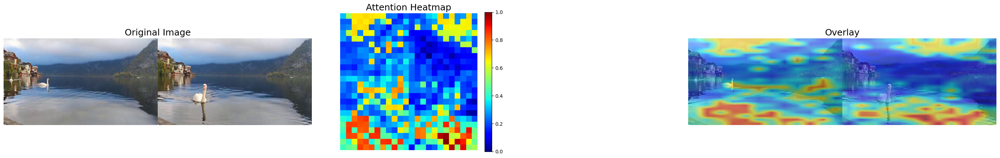


Attention Analysis:
  Left:  0.4045
  Right: 0.3284
  Ratio: 1.2324
  → Model focuses on LEFT


In [ ]:
sample_image = os.path.join(IMAGE_FOLDER, "211.jpg")

attention_map, (left_attn, right_attn) = plot_temporal_comparison(
    sample_image, model, image_processor,
    save_path="test.png",
)


[1/720] 0.jpg
✓ Successfully hooked into vision tower last layer


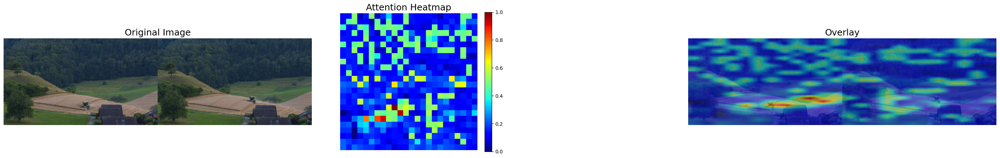


Attention Analysis:
  Left:  0.2460
  Right: 0.2174
  Ratio: 1.1318
  → Model focuses on LEFT

[2/720] 1.jpg
✓ Successfully hooked into vision tower last layer


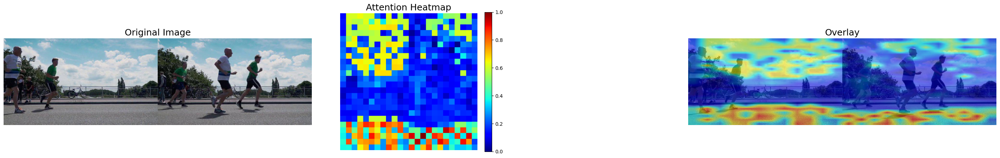


Attention Analysis:
  Left:  0.3823
  Right: 0.2620
  Ratio: 1.4590
  → Model focuses on LEFT

[3/720] 10.jpg
✓ Successfully hooked into vision tower last layer


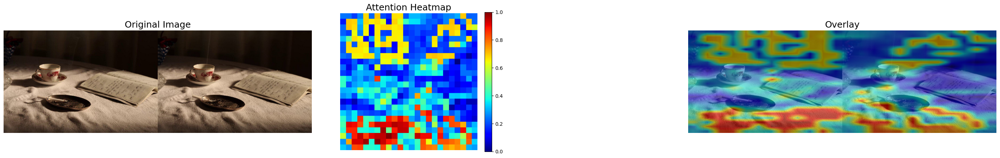


Attention Analysis:
  Left:  0.4426
  Right: 0.3428
  Ratio: 1.2910
  → Model focuses on LEFT

[4/720] 100.jpg
✓ Successfully hooked into vision tower last layer


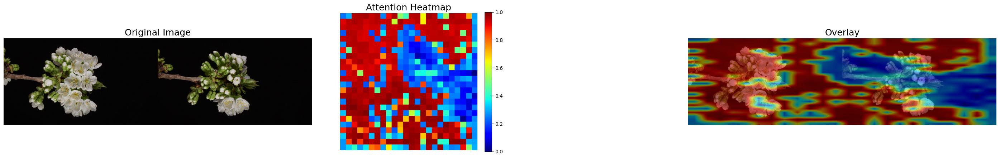


Attention Analysis:
  Left:  0.7529
  Right: 0.5542
  Ratio: 1.3584
  → Model focuses on LEFT

[5/720] 101.jpg
✓ Successfully hooked into vision tower last layer


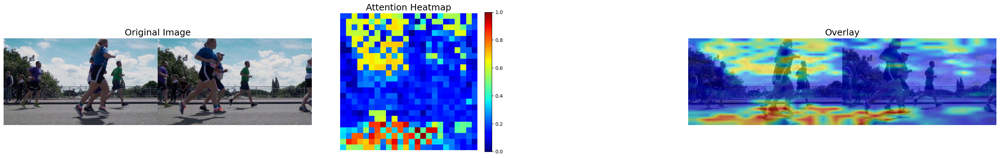


Attention Analysis:
  Left:  0.3601
  Right: 0.2267
  Ratio: 1.5889
  → Model focuses on LEFT

[6/720] 102.jpg
✓ Successfully hooked into vision tower last layer


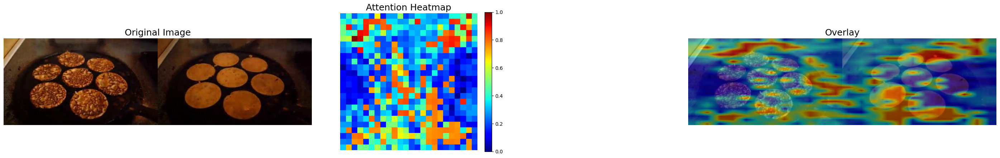


Attention Analysis:
  Left:  0.3899
  Right: 0.3867
  Ratio: 1.0078
  → Model focuses on LEFT

[7/720] 103.jpg
✓ Successfully hooked into vision tower last layer


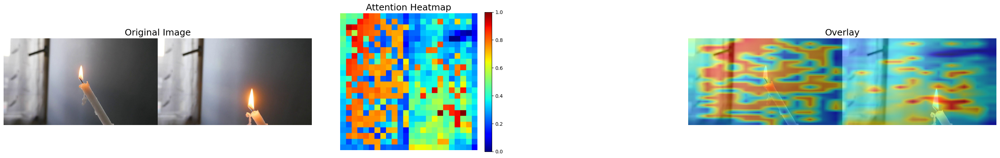


Attention Analysis:
  Left:  0.5347
  Right: 0.4277
  Ratio: 1.2500
  → Model focuses on LEFT

[8/720] 104.jpg
✓ Successfully hooked into vision tower last layer


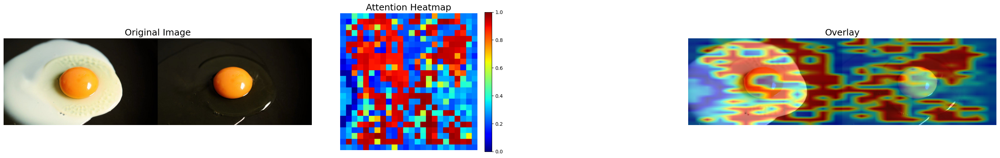


Attention Analysis:
  Left:  0.5498
  Right: 0.5176
  Ratio: 1.0625
  → Model focuses on LEFT

[9/720] 105.jpg
✓ Successfully hooked into vision tower last layer


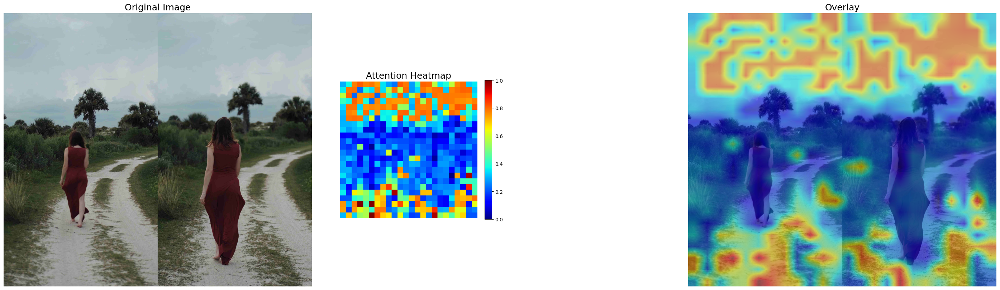


Attention Analysis:
  Left:  0.4021
  Right: 0.3853
  Ratio: 1.0439
  → Model focuses on LEFT

[10/720] 106.jpg
✓ Successfully hooked into vision tower last layer


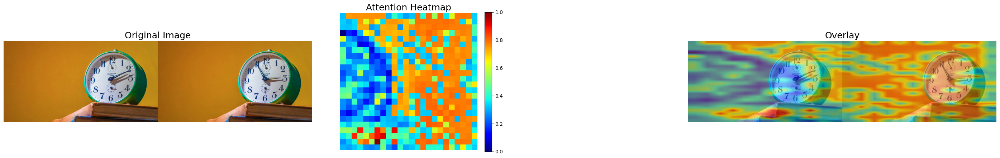


Attention Analysis:
  Left:  0.4180
  Right: 0.6279
  Ratio: 0.6655
  → Model focuses on RIGHT


In [ ]:
import os

IMAGE_FOLDER = "../temporal/workspace/data"

image_files = sorted([f for f in os.listdir(IMAGE_FOLDER) if f.endswith(".jpg")])

for i, img_name in enumerate(image_files[:10]):
    print(f"\n{'='*60}")
    print(f"[{i+1}/{len(image_files)}] {img_name}")

    img_path = os.path.join(IMAGE_FOLDER, img_name)

    attention_map, (left_attn, right_attn) = plot_temporal_comparison(
        img_path,
        model,
        image_processor,
        # save_path=f"gradcam_{i+1}.png"
    )


# RecipeQA notes

Keep the RecipeQA evaluation snippet nearby so we do not have to dig around later.


[1/3] recipeqa_50_0 | GT: true
✓ Successfully hooked into vision tower last layer

Step attention:
  Step 1: 0.1888
  Step 2: 0.1520
  Step 3: 0.1885
  Step 4: 0.2935


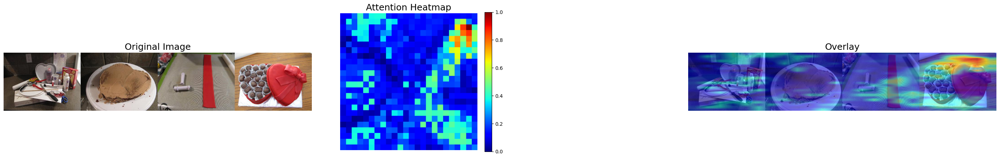


[2/3] recipeqa_50_1 | GT: false
✓ Successfully hooked into vision tower last layer

Step attention:
  Step 1: 0.2637
  Step 2: 0.4138
  Step 3: 0.3259
  Step 4: 0.2786


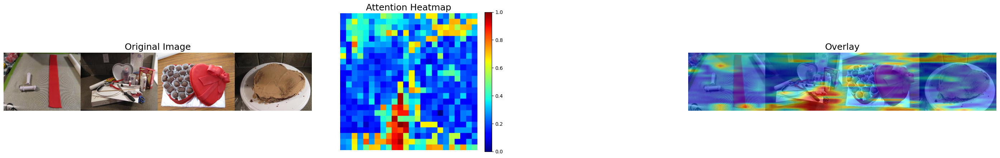


[3/3] recipeqa_50_2 | GT: false
✓ Successfully hooked into vision tower last layer

Step attention:
  Step 1: 0.4731
  Step 2: 0.5503
  Step 3: 0.4819
  Step 4: 0.3511


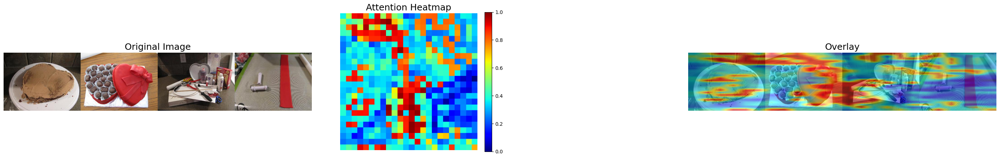


RECIPEQA ATTENTION SUMMARY
Step 1 avg attention: 0.3086
Step 2 avg attention: 0.3721
Step 3 avg attention: 0.3323
Step 4 avg attention: 0.3079


[{'id': 'recipeqa_50_0',
  'ground_truth': 'true',
  'step_attention': [np.float16(0.1888),
   np.float16(0.152),
   np.float16(0.1885),
   np.float16(0.2935)],
  'max_step': 4},
 {'id': 'recipeqa_50_1',
  'ground_truth': 'false',
  'step_attention': [np.float16(0.2637),
   np.float16(0.4138),
   np.float16(0.326),
   np.float16(0.2786)],
  'max_step': 2},
 {'id': 'recipeqa_50_2',
  'ground_truth': 'false',
  'step_attention': [np.float16(0.4731),
   np.float16(0.5503),
   np.float16(0.482),
   np.float16(0.351)],
  'max_step': 2}]

In [ ]:
analyze_recipeqa_samples(model, image_processor, "../recipeqa/recipeqa_test.json", "../recipeqa/test", num_samples=3)